In [53]:
import numpy as np
from scipy.linalg import expm, null_space, solve
import matplotlib.pyplot as plt
import networkx as nx

from qlinks.lattice.square_lattice import SquareLattice
from qlinks.symmetry.gauss_law import GaussLaw
from qlinks.computation_basis import ComputationBasis
from qlinks.solver.deep_first_search import DeepFirstSearch
from qlinks.model import QuantumLinkModel
from qlinks.visualizer.graph import GraphVisualizer

In [37]:
def format_custom_index(index):
    return [f"({i}) {idx}" for i, idx in enumerate(index)]

# Lattice 4x2

In [5]:
scar = np.array([
    [0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1],  # 5037
    [0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 0],  # 9678
    [0, 0, 1, 1, 0, 0, 0, 1, 1, 1, 0, 1, 1, 0, 1, 0],  # 12762
    [0, 1, 0, 1, 0, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0],  # 21228
    # [0, 0, 0, 1, 0, 0, 0, 1, 1, 1, 1, 0, 1, 1, 1, 0],  # 4509
    # [0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 0, 0, 1]  # 13209
])

In [64]:
lattice_shape = (4, 2)
gauss_law = GaussLaw.from_staggered_charge_distri(*lattice_shape)
gauss_law.flux_sector = (0, 0)
dfs = DeepFirstSearch(gauss_law, max_steps=int(1e+4))
basis = gauss_law.to_basis(dfs.solve(n_solution=16))

coup_j, coup_rk = (1, -0.1)
model = QuantumLinkModel(coup_j, coup_rk, lattice_shape, basis)
ham = model.hamiltonian
evals, evecs = np.linalg.eigh(ham)

2023-12-04 00:58:32 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-04 00:58:33 [deep_first_search.py] INFO: Found 16 Solutions as required in 103 steps.


In [7]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
(0) 17595,0,1,0,0,0,1,0,0,1,0,1,1,1,0,1,1
(1) 18867,0,1,0,0,1,0,0,1,1,0,1,1,0,0,1,1
(2) 19638,0,1,0,0,1,1,0,0,1,0,1,1,0,1,1,0
(3) 36135,1,0,0,0,1,1,0,1,0,0,1,0,0,1,1,1
(4) 37947,1,0,0,1,0,1,0,0,0,0,1,1,1,0,1,1
(5) 39219,1,0,0,1,1,0,0,1,0,0,1,1,0,0,1,1
(6) 39990,1,0,0,1,1,1,0,0,0,0,1,1,0,1,1,0
(7) 44307,1,0,1,0,1,1,0,1,0,0,0,1,0,0,1,1
(8) 50283,1,1,0,0,0,1,0,0,0,1,1,0,1,0,1,1
(9) 51555,1,1,0,0,1,0,0,1,0,1,1,0,0,0,1,1


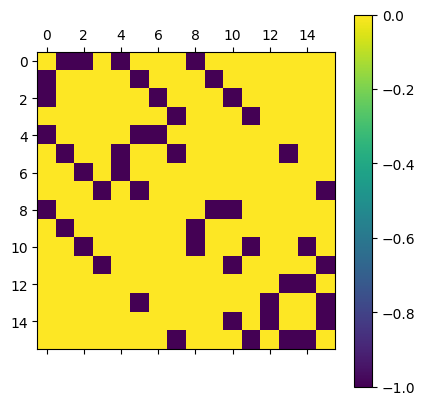

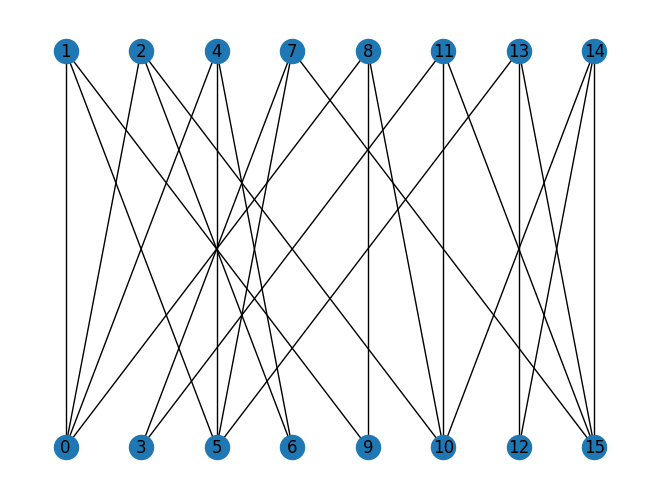

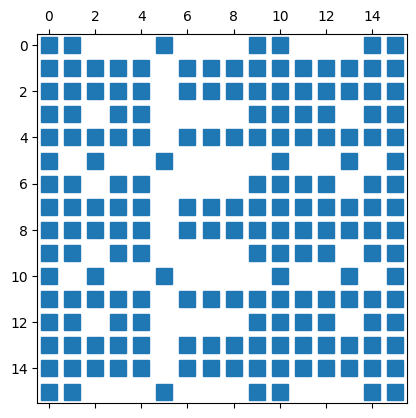

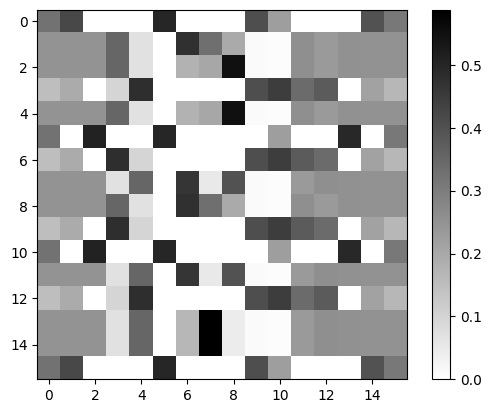

In [80]:
plt.matshow(model.kinetic_term)
plt.colorbar()
plt.show()

g = nx.from_numpy_array(-model.kinetic_term)
assert nx.is_bipartite(g)
left, right = nx.bipartite.sets(g)
pos = nx.bipartite_layout(g, left, align="horizontal")
nx.draw(g, pos, with_labels=True)
plt.show()

plt.spy(evecs, precision=1e-12, markersize=12)
plt.show()

plt.imshow(np.abs(evecs), interpolation='none', cmap='binary')
plt.colorbar()
plt.show()

In [86]:
# ns = null_space(-model.kinetic_term)
# plt.matshow(ns.T)
# plt.colorbar()
# np.linalg.matrix_rank(model.kinetic_term)

nx.k_core(g, k=2).edges()

EdgeView([(0, 1), (0, 2), (0, 4), (0, 8), (1, 5), (1, 9), (2, 6), (2, 10), (3, 7), (3, 11), (4, 5), (4, 6), (5, 7), (5, 13), (7, 15), (8, 9), (8, 10), (10, 11), (10, 14), (11, 15), (12, 13), (12, 14), (13, 15), (14, 15)])

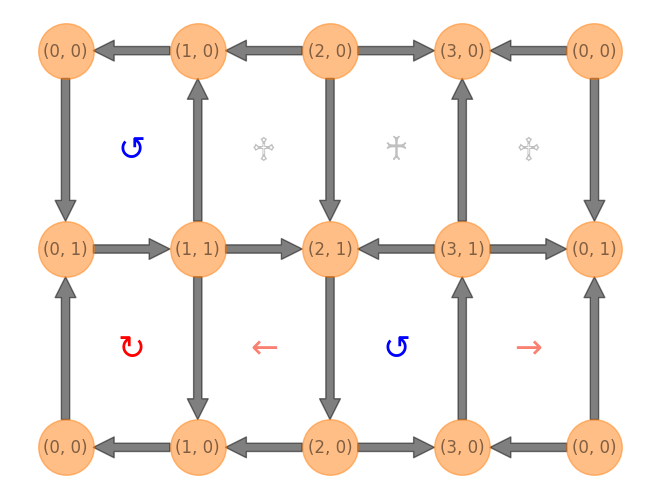

In [77]:
g = GraphVisualizer(SquareLattice(*lattice_shape, basis.dataframe.iloc[1]))
g.plot()

In [42]:
evecs[:, 5:9]

array([[-5.00000000e-01, -1.65314690e-15,  8.38222196e-16,
        -1.93670690e-16],
       [ 1.10257314e-17, -3.23650112e-01, -5.08970574e-01,
        -1.05827972e-01],
       [ 1.56851409e-16,  3.23650112e-01,  5.08970574e-01,
         1.05827972e-01],
       [ 5.55111512e-17,  1.36002321e-15, -5.55111512e-17,
         2.77555756e-17],
       [-8.22766909e-16,  5.83589631e-01, -1.48603603e-01,
         1.11086054e-01],
       [ 5.00000000e-01,  2.77555756e-16, -7.21644966e-16,
         1.94289029e-16],
       [-9.71445147e-17, -1.66533454e-16,  1.35481903e-15,
        -7.14706072e-16],
       [ 2.77555756e-16, -2.77702724e-02,  3.65283830e-01,
        -4.90710236e-01],
       [ 9.07812946e-16, -5.83589631e-01,  1.48603603e-01,
        -1.11086054e-01],
       [-6.93889390e-17,  0.00000000e+00,  1.03909936e-15,
        -5.89805982e-16],
       [ 5.00000000e-01,  3.60822483e-16, -8.32667268e-16,
         2.63677968e-16],
       [-6.10622664e-16,  2.32169247e-01, -2.92290347e-01,
      

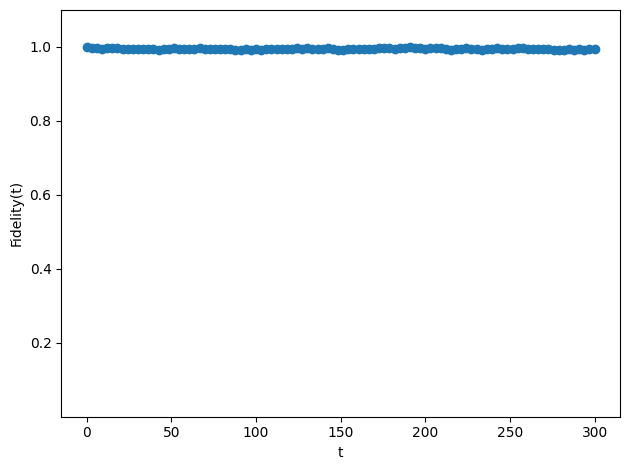

noise_idx = 4590
O_kin @ psi_scar = [ 0.         -0.04993762 -0.04993762  0.         -0.04993762  0.
  0.          0.         -0.04993762  0.          0.          0.
  0.          0.          0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.3002493765586035
<H> = -0.3002493765586035


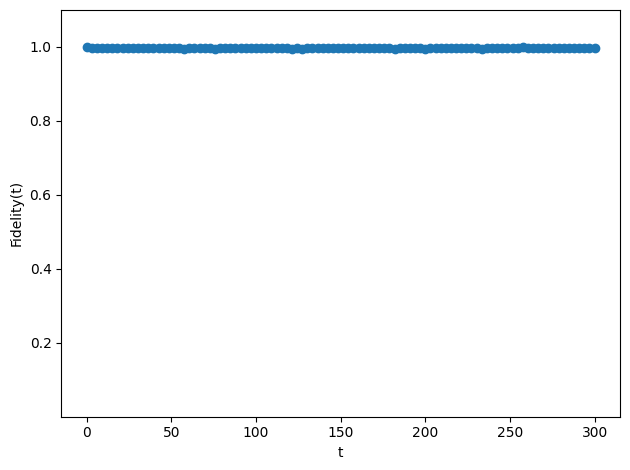

noise_idx = 5037
O_kin @ psi_scar = [-0.04873702  0.          0.         -0.04873702  0.         -0.04873702
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.29999999999999993
<H> = -0.29999999999999993


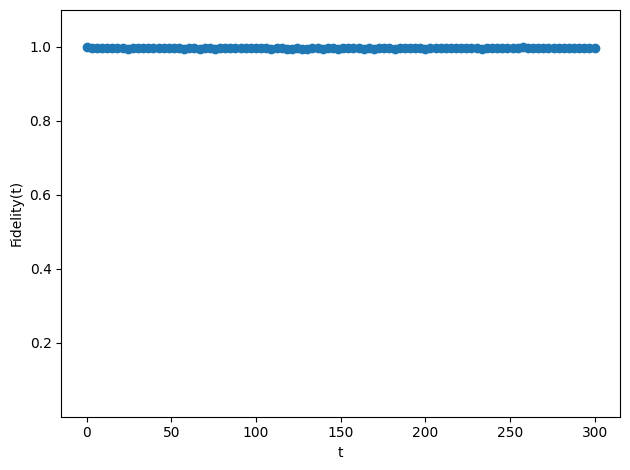

noise_idx = 9678
O_kin @ psi_scar = [-0.05123155  0.          0.         -0.05123155  0.          0.
  0.          0.          0.          0.         -0.05123155  0.
  0.          0.          0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.3000000000000001
<H> = -0.3000000000000001


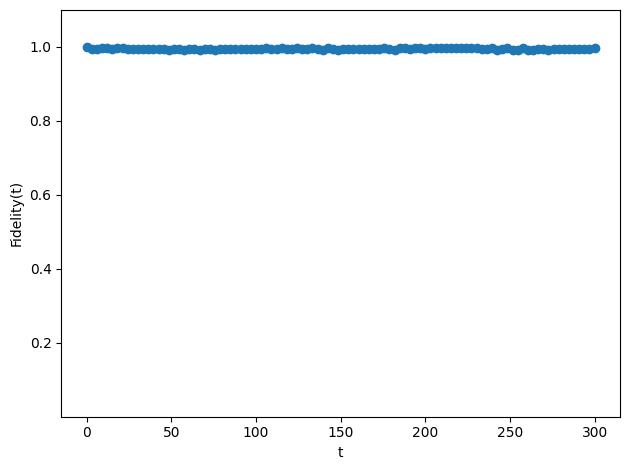

noise_idx = 10125
O_kin @ psi_scar = [ 0.         -0.04993762 -0.04993762  0.          0.          0.
  0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.2997506234413965
<H> = -0.2997506234413965


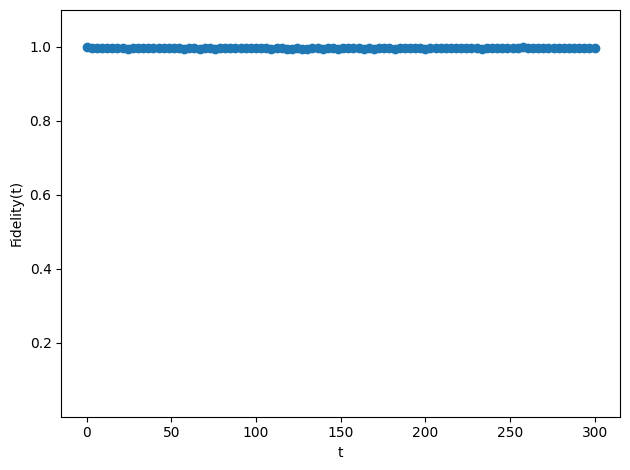

noise_idx = 12762
O_kin @ psi_scar = [-0.05123155  0.          0.          0.          0.         -0.05123155
  0.          0.          0.          0.          0.          0.
 -0.05123155  0.          0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.3000000000000001
<H> = -0.3000000000000001


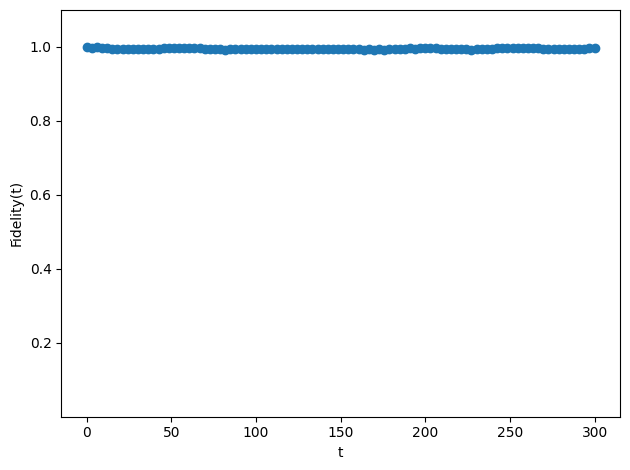

noise_idx = 13209
O_kin @ psi_scar = [ 0.         -0.04993762  0.          0.         -0.04993762  0.
  0.         -0.04993762  0.          0.          0.          0.
  0.         -0.04993762  0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.3002493765586035
<H> = -0.3002493765586035


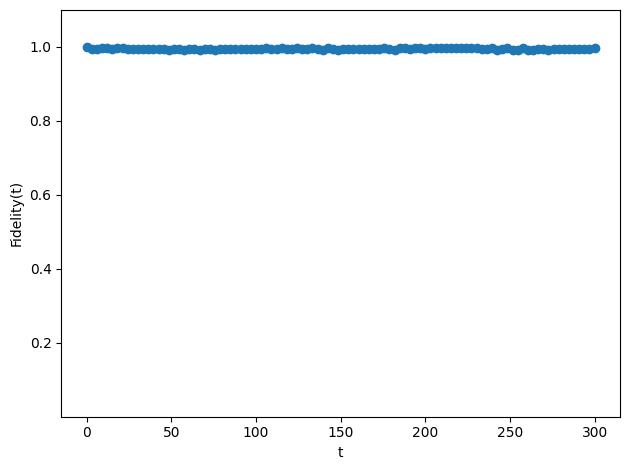

noise_idx = 13980
O_kin @ psi_scar = [ 0.          0.          0.          0.          0.          0.
  0.         -0.04993762  0.          0.          0.          0.
  0.          0.         -0.04993762  0.        ]
<O_kin> = 0.0
<O_pot> = -0.2997506234413965
<H> = -0.2997506234413965


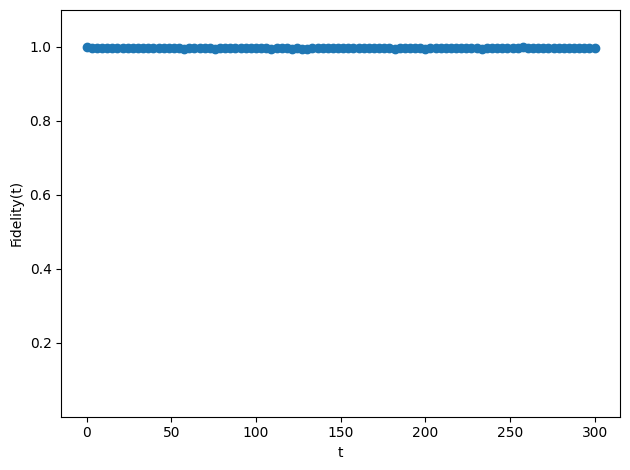

noise_idx = 15252
O_kin @ psi_scar = [ 0.          0.          0.          0.          0.         -0.04993762
 -0.04993762  0.          0.          0.          0.          0.
  0.          0.          0.         -0.04993762]
<O_kin> = 0.0
<O_pot> = -0.30000000000000004
<H> = -0.30000000000000004


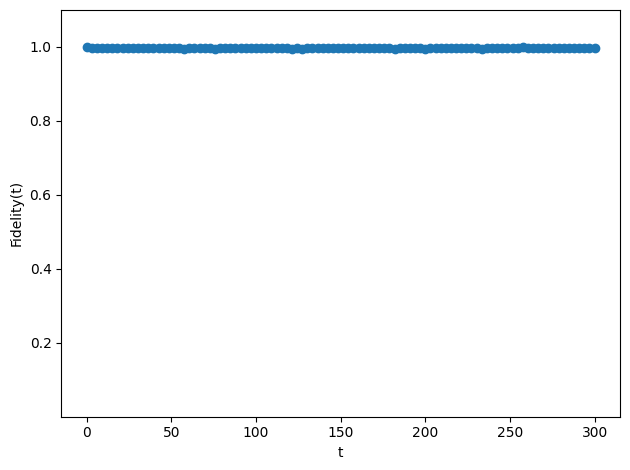

noise_idx = 21228
O_kin @ psi_scar = [-0.04873702  0.          0.          0.          0.          0.
  0.          0.          0.          0.         -0.04873702  0.
 -0.04873702  0.          0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.29999999999999993
<H> = -0.29999999999999993


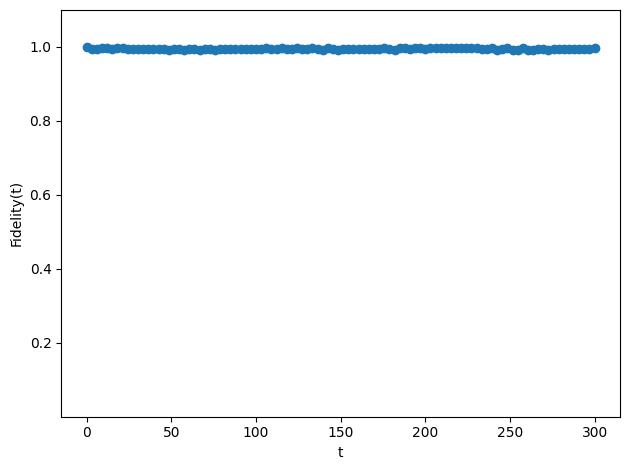

noise_idx = 25545
O_kin @ psi_scar = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.          0.          0.         -0.04993762
  0.         -0.04993762  0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.2997506234413965
<H> = -0.2997506234413965


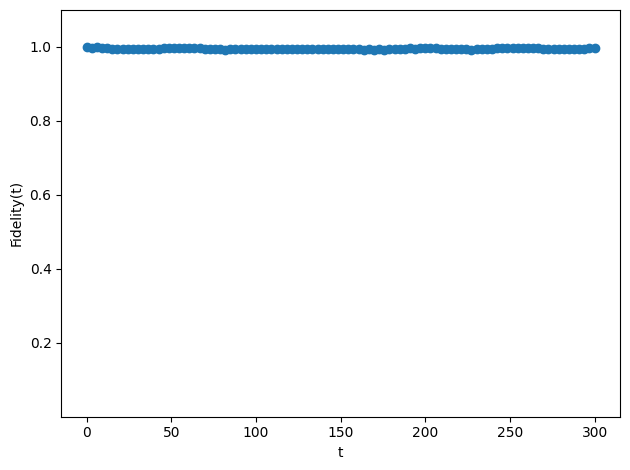

noise_idx = 26316
O_kin @ psi_scar = [ 0.          0.         -0.04993762  0.          0.          0.
  0.          0.         -0.04993762  0.          0.         -0.04993762
  0.          0.         -0.04993762  0.        ]
<O_kin> = 0.0
<O_pot> = -0.3002493765586035
<H> = -0.3002493765586035


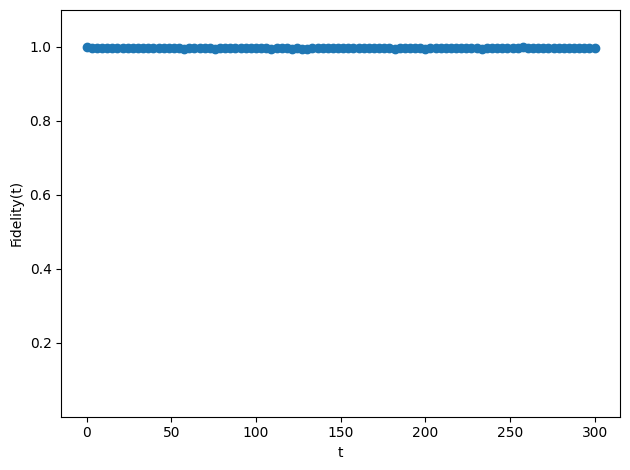

noise_idx = 27588
O_kin @ psi_scar = [ 0.          0.          0.          0.          0.          0.
  0.          0.          0.         -0.04993762 -0.04993762  0.
  0.          0.          0.         -0.04993762]
<O_kin> = 0.0
<O_pot> = -0.30000000000000004
<H> = -0.30000000000000004


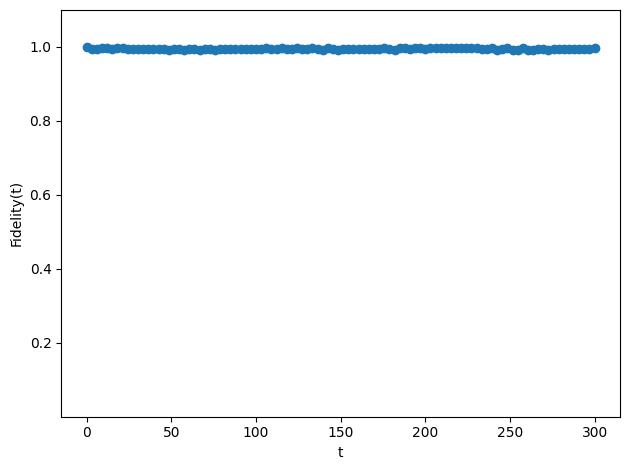

noise_idx = 29400
O_kin @ psi_scar = [ 0.          0.          0.          0.         -0.04993762  0.
  0.          0.         -0.04993762  0.          0.          0.
  0.          0.          0.          0.        ]
<O_kin> = 0.0
<O_pot> = -0.2997506234413965
<H> = -0.2997506234413965


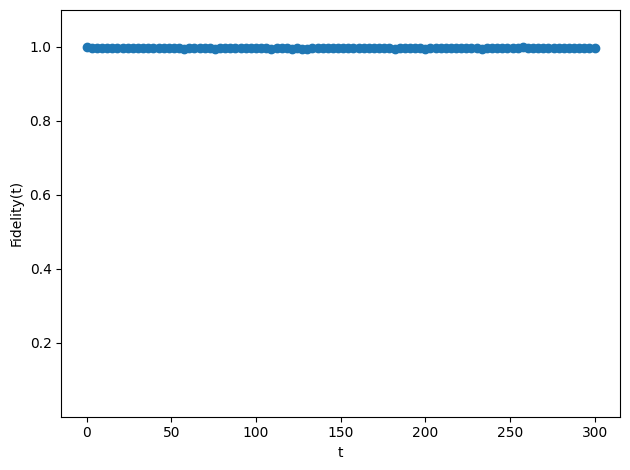

noise_idx = 45897
O_kin @ psi_scar = [ 0.          0.          0.          0.          0.         -0.04993762
  0.          0.          0.         -0.04993762  0.          0.
  0.          0.          0.         -0.04993762]
<O_kin> = 0.0
<O_pot> = -0.30000000000000004
<H> = -0.30000000000000004


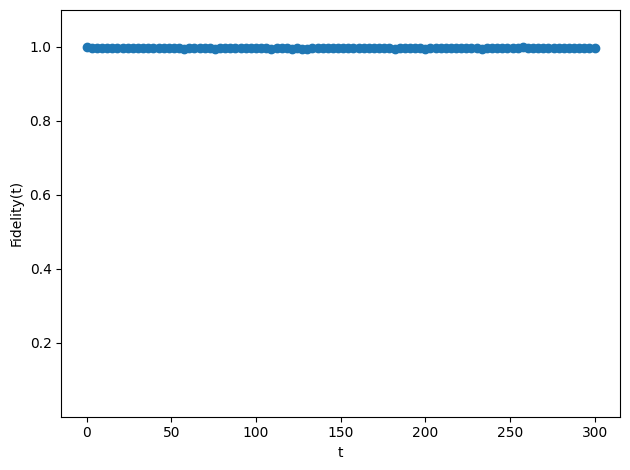

noise_idx = 46668
O_kin @ psi_scar = [ 0.          0.          0.          0.          0.          0.
 -0.04993762  0.          0.          0.         -0.04993762  0.
  0.          0.          0.         -0.04993762]
<O_kin> = 0.0
<O_pot> = -0.30000000000000004
<H> = -0.30000000000000004


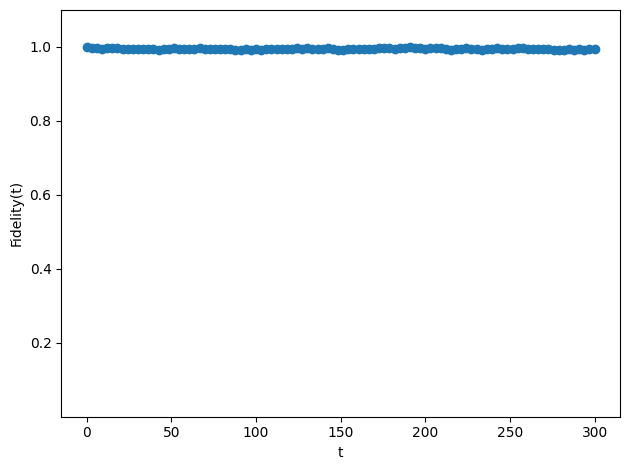

noise_idx = 47940
O_kin @ psi_scar = [ 0.          0.          0.          0.          0.          0.
  0.         -0.04993762  0.          0.          0.         -0.04993762
  0.         -0.04993762 -0.04993762  0.        ]
<O_kin> = 0.0
<O_pot> = -0.3002493765586035
<H> = -0.3002493765586035


In [47]:
noise_strength = 0.1

for i, row in basis.dataframe.iterrows():
    noise = row.to_numpy().astype(int)
    noise_idx = int("".join(map(str, noise)), 2)
    scar = np.append(scar, [noise], axis=0)

    scar_basis = ComputationBasis(scar)
    scar_basis.sort()
    assert basis.dataframe.loc[scar_basis.index].equals(scar_basis.dataframe)

    scar_state = np.zeros((basis.n_states, 1))
    scar_state[basis.dataframe.index.get_loc(noise_idx), :] += noise_strength
    scar_state[basis.dataframe.index.get_loc(5037), :] += 1
    scar_state[basis.dataframe.index.get_loc(9678), :] += -1
    scar_state[basis.dataframe.index.get_loc(12762), :] += -1
    scar_state[basis.dataframe.index.get_loc(21228), :] += 1
    scar_state /= np.linalg.norm(scar_state)

    fidelity = []
    for t in np.linspace(0, 300, 100):
        evol = expm(-1j * t * ham)
        evol_state = evol @ scar_state
        fidelity.append(np.abs(evol_state.T @ scar_state).item() ** 2)

    plt.plot(np.linspace(0, 300, 100), fidelity, linestyle="--", marker="o")
    plt.ylim(0.0001, 1.1)
    # plt.yscale('log')
    plt.xlabel("t")
    plt.ylabel("Fidelity(t)")
    plt.tight_layout()
    plt.show()
    
    print(f"noise_idx = {noise_idx}")
    print(f"O_kin @ psi_scar = {(model.kinetic_term @ scar_state).flatten()}")
    print(f"<O_kin> = {(scar_state.T @ model.kinetic_term @ scar_state).item()}")
    print(f"<O_pot> = {(scar_state.T @ model.potential_term @ scar_state).item()}")
    print(f"<H> = {(scar_state.T @ ham @ scar_state).item()}")
    # np.testing.assert_allclose(evecs[:, 7], scar_state.T, atol=1e-12)

# Lattice 4x4

In [50]:
lattice_shape = (4, 4)
gauss_law = GaussLaw.from_staggered_charge_distri(*lattice_shape)
gauss_law.flux_sector = (0, 0)
dfs = DeepFirstSearch(gauss_law, max_steps=int(1e+5))
basis = gauss_law.to_basis(dfs.solve(n_solution=132))

coup_j, coup_rk = (1, 1)
model = QuantumLinkModel(coup_j, coup_rk, lattice_shape, basis)
ham = model.hamiltonian
evals, evecs = np.linalg.eigh(ham)

2023-12-03 21:40:23 [deep_first_search.py] INFO: Deep First Search starts.
2023-12-03 21:40:24 [deep_first_search.py] INFO: Found 132 Solutions as required in 1626 steps.


In [38]:
df = basis.dataframe.copy(deep=True)
df.index = format_custom_index(df.index)
df

,0,1,2,3,4,5,6,7,8,9,...,22,23,24,25,26,27,28,29,30,31
(0) 1142025915,0,1,0,0,0,1,0,0,0,0,...,1,0,1,0,1,1,1,0,1,1
(1) 1143328443,0,1,0,0,0,1,0,0,0,0,...,1,0,1,0,1,1,1,0,1,1
(2) 1146285243,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(3) 1147587771,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
(4) 1147913403,0,1,0,0,0,1,0,0,0,1,...,0,0,1,0,1,1,1,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
(127) 3998411793,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(128) 3999714321,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(129) 4000039953,1,1,1,0,1,1,1,0,0,1,...,0,0,0,0,0,1,0,0,0,1
(130) 4004924433,1,1,1,0,1,1,1,0,1,0,...,0,0,0,0,0,1,0,0,0,1


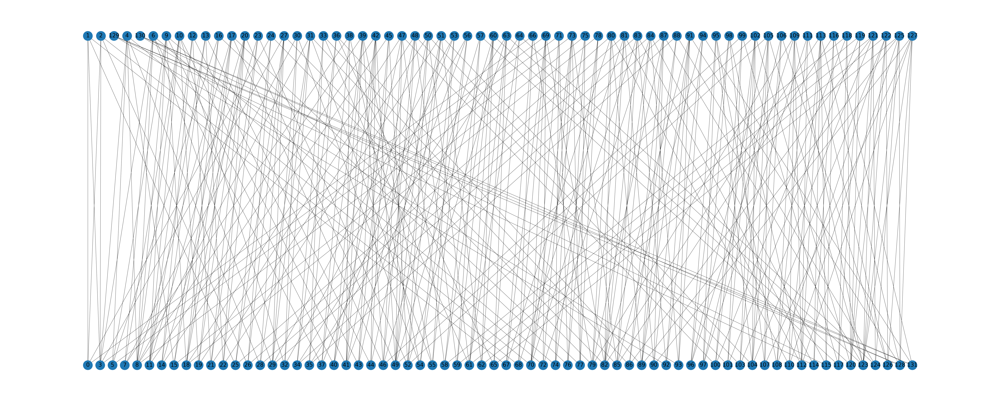

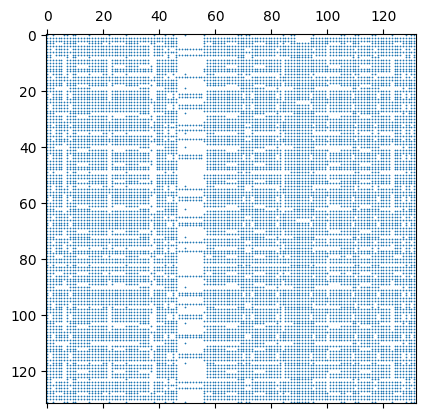

In [57]:
# plt.matshow(ham)
# plt.colorbar()
# plt.show()

g = nx.from_numpy_array(model.kinetic_term)
left, right = nx.bipartite.sets(g)
pos = nx.bipartite_layout(g, left, align='horizontal')
# pos = nx.spectral_layout(g)
fig = plt.figure(figsize=(80, 32))
nx.draw(g, pos, with_labels=True, node_size=3000, font_size=32)
plt.show()

plt.spy(evecs, precision=1e-12, markersize=0.3)
plt.show()

# plt.imshow(np.abs(evecs), interpolation='none', cmap='binary')
# plt.colorbar()
# plt.show()

102


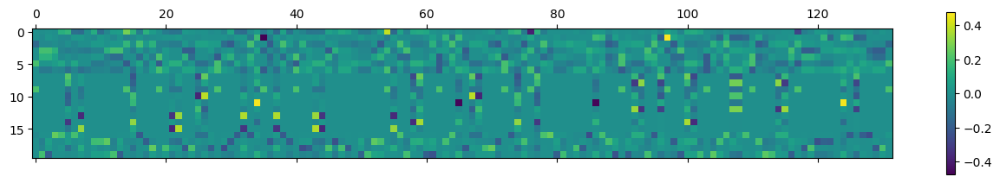

In [59]:
print(np.linalg.matrix_rank(model.kinetic_term))

plt.matshow(evecs[:, 40:60].T)
plt.colorbar()

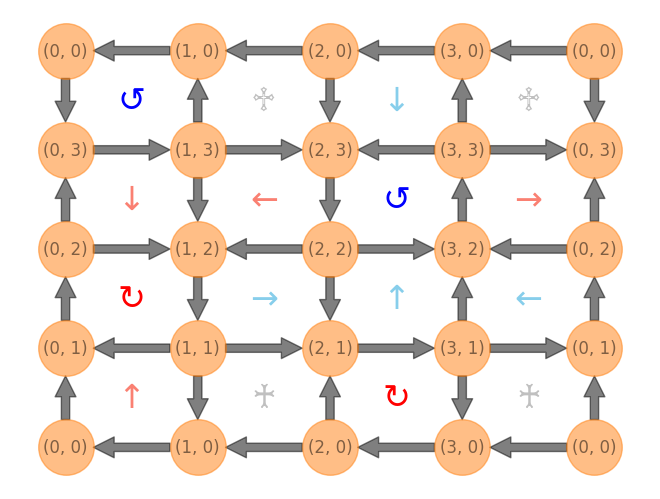

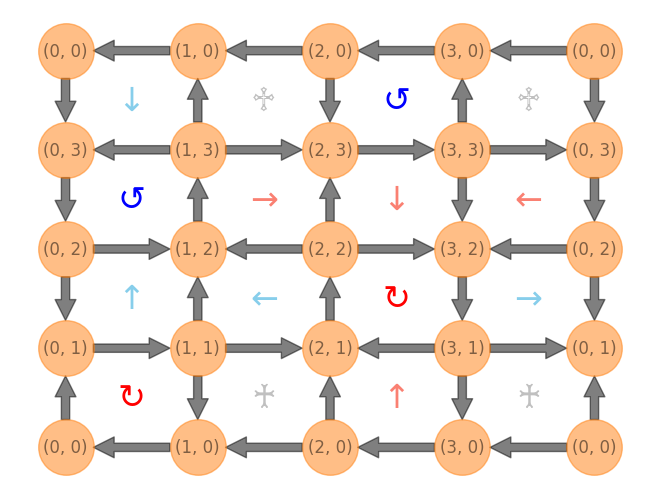

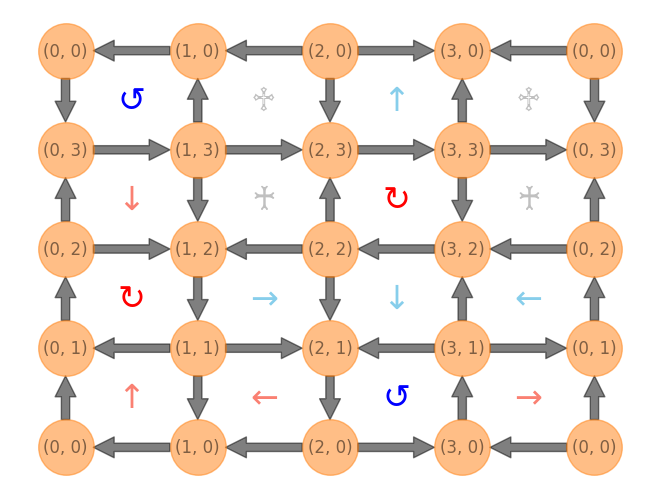

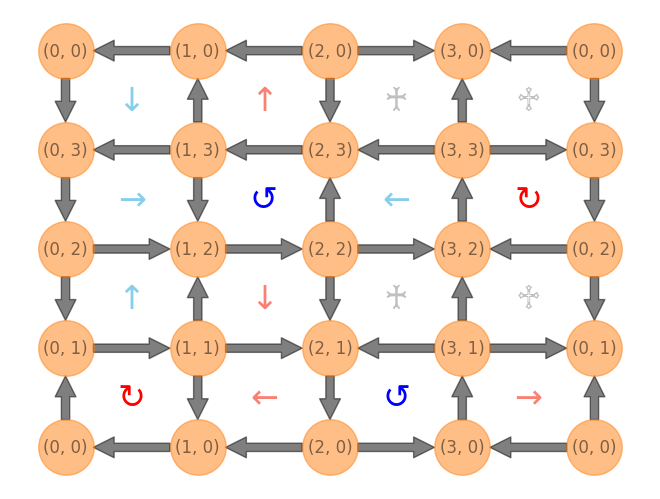

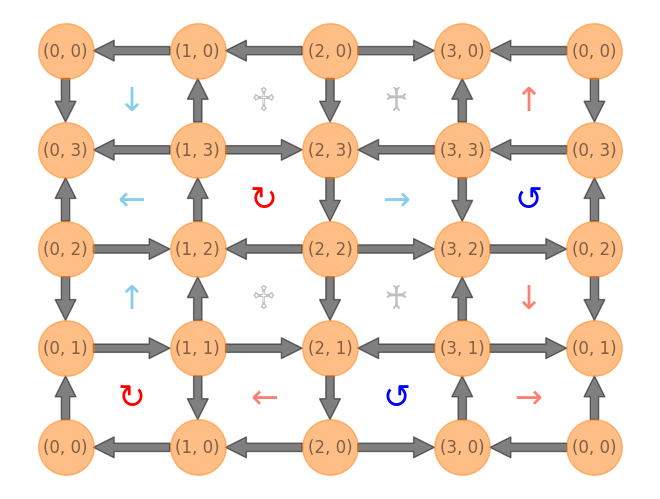

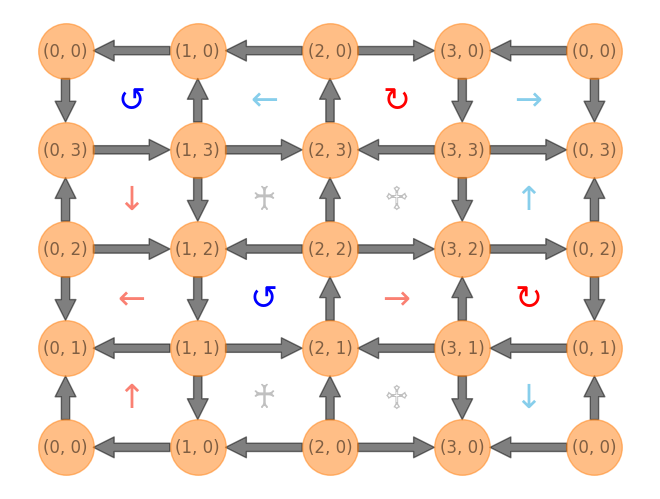

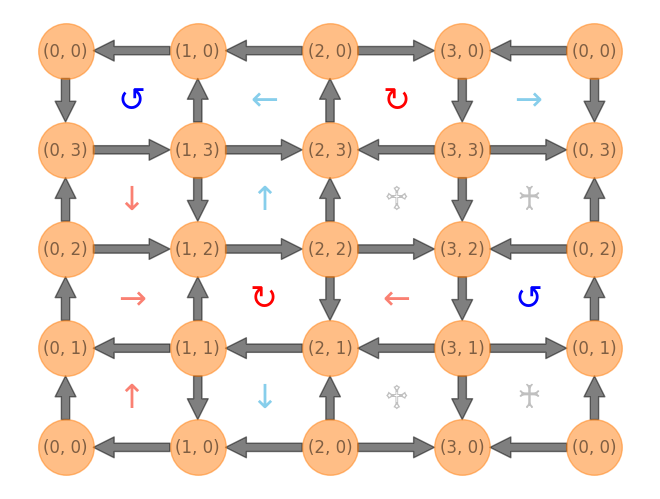

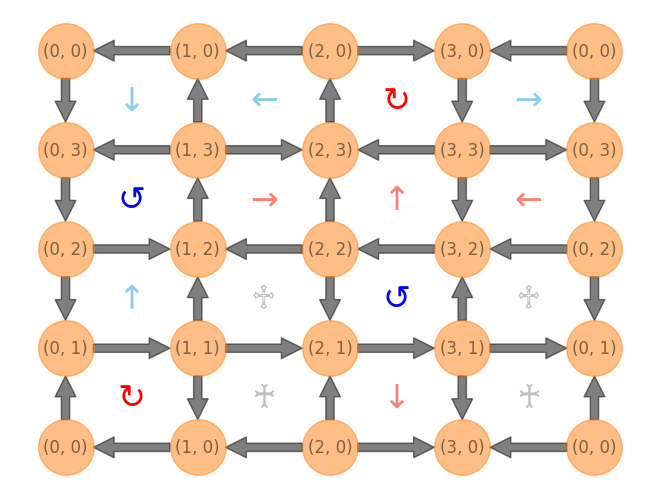

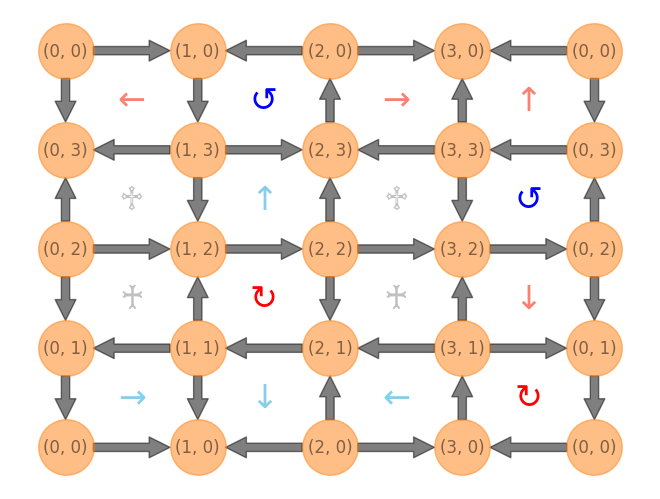

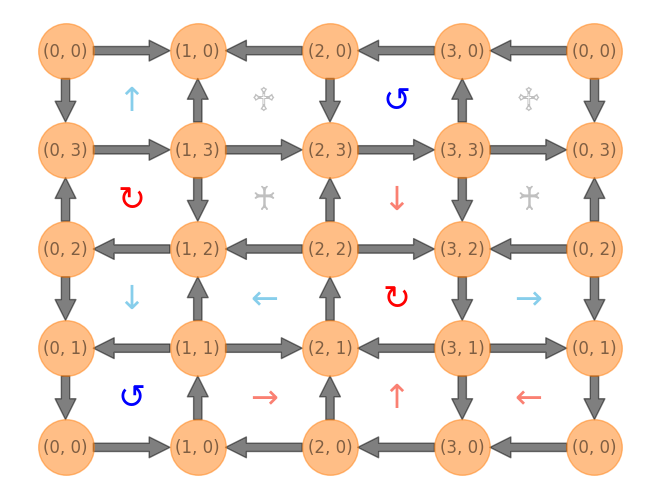

In [44]:
# {i: len(np.where(np.abs(evecs[:, i]) > 1e-12)[0]) for i in range(300)}

for i in np.where(np.abs(evecs[:, 50]) > 1e-12)[0][:10]:
    g = GraphVisualizer(SquareLattice(*lattice_shape, basis.dataframe.iloc[i]))
    # plt.figure(figsize=(10, 4), facecolor='white')
    g.plot()